# RNA integration of the in vitro multiome with the in vivo multiome reference

### To do:
- Try out normalisation with SCTransfrom instead of NormalizeData, and corresponding integration</br>
- Try CCA integration instead of rPCA</br>
- Integrate the original atlas & multiome RNA in one step using FindIntegrationAnchors with both set to reference </br>
- 

## Load Packages

In [1]:
suppressPackageStartupMessages({ # this first line makes sure you don't get all the start up messages
    library(data.table) # used for manipulating data
    library(dplyr) # used for the 'pipes'
    library(ggplot2) # used for plotting data
    library(Seurat)
    library(SingleCellExperiment)
    library(dplyr)
    #library(celldex)
    #library(SingleR)
    library(RColorBrewer)
    library(future)
})

In [2]:
# # Multi core using future - built in to seurat
# plan("multicore", workers = 16)
# options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

## Set Data Locations

In [3]:
# We want to specify as many variables as possible in the very beginning and as few as possible in the actual code
# If you do this, you can reproduce your code for other projects with only having to change the variables in the first block
# Otherwise, you will have to go through the whole code and change all places that have certain variables

io = list() # here we make an object called 'io', standing for input/output, which is an empty list
# now we are going to assign paths to files to this io list
io$main = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood" # this is the main directory

#Specify paths to HE multiome files
io$multiome_HE_metadata = file.path(io$main, "results/rna/mapping/sample_metadata_after_mapping.txt.gz") # This specifies to a location within the main folder
io$multiome_HE_seurat = file.path(io$main, "processed/rna/seurat.rds")

#Specify paths to reference atlas
io$multiome_atlas =  "/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome"
io$multiome_sce = file.path(io$multiome_atlas, "data/processed/rna/SingleCellExperiment.rds")
io$multiome_metadata = file.path(io$multiome_atlas, "results/rna/mapping/sample_metadata_after_mapping.txt.gz")

#outdir
io$outdir = file.path(io$main, '/results/multiome_atlas_integration/rna/')

## Colours to Use

In [4]:
# We can add colours as well if you really want! 
# this is the colour scheme, we usually keep this in a seperate file that we then call in our notebooks
celltype.colors = c(
  "Epiblast" = "#635547",
  "Primitive_Streak" = "#DABE99",
  "Caudal_epiblast" = "#9e6762",
  "PGC" = "#FACB12",
  "Anterior_Primitive_Streak" = "#c19f70",
  "Notochord" = "#0F4A9C",
  "Def._endoderm" = "#F397C0",
  "Gut" = "#EF5A9D",
  "Nascent_mesoderm" = "#C594BF",
  "Mixed_mesoderm" = "#DFCDE4",
  "Intermediate_mesoderm" = "#139992",
  "Caudal_Mesoderm" = "#3F84AA",
  "Paraxial_mesoderm" = "#8DB5CE",
  "Somitic_mesoderm" = "#005579",
  "Pharyngeal_mesoderm" = "#C9EBFB",
  "Cardiomyocytes" = "#B51D8D",
  "Allantois" = "#532C8A",
  "ExE_mesoderm" = "#8870ad",
  "Mesenchyme" = "#cc7818",
  "Haematoendothelial_progenitors" = "#FBBE92",
  "Endothelium" = "#ff891c",
  "Blood_progenitors" = "#c9a997",
  "Blood_progenitors_1" = "#f9decf",
  "Blood_progenitors_2" = "#c9a997",
  "Erythroid" = "#EF4E22",
  "Erythroid1" = "#C72228",
  "Erythroid2" = "#f79083",
  "Erythroid3" = "#EF4E22",
  "NMP" = "#8EC792",
  "Neurectoderm" = "#65A83E",
  "Rostral_neurectoderm" = "#65A83E",
  "Caudal_neurectoderm" = "#354E23",
  "Neural_crest" = "#C3C388",
  "Forebrain_Midbrain_Hindbrain" = "#647a4f",
  "Spinal_cord" = "#CDE088",
  "Surface_ectoderm" = "#f7f79e",
  "Visceral_endoderm" = "#F6BFCB",
  "ExE_endoderm" = "#7F6874",
  "ExE_ectoderm" = "#989898",
  "Parietal_endoderm" = "#1A1A1A"
)

In [5]:
celltype.colors.extended.mesoderm = c(
"Epiblast" = "#635547",
"Primitive Streak" = "#DABE99",
"Caudal epiblast" = "#9e6762",
"PGC" = "#FACB12",
"Anterior Primitive Streak" = "#c19f70",
"Node"="#153b3d",
"Notochord" = "#0F4A9C",
"Nascent mesoderm" = "#C594BF",
"Intermediate mesoderm" = "#139992",
"Caudal mesoderm" = "#3F84AA",
"Lateral plate mesoderm" = "#F9DFE6",
"Limb mesoderm" = "#e35f82",
"Forelimb" = "#d02d75",
"Kidney primordium" = "#e85639",
"Presomitic mesoderm"="#5581ca",#"#0000ff",#blue
"Somitic mesoderm" = "#005579",
"Posterior somitic tissues" = "#5adbe4",#"#40e0d0",#turquoise
"Paraxial mesoderm" = "#8DB5CE",
"Cranial mesoderm" = "#456722",#"#006400",#darkgreen
"Anterior somitic tissues"= "#d5e839",
"Sclerotome" = "#e3cb3a",#"#ffff00",#yellow
"Dermomyotome" = "#00BFC4",#"#a52a2a",#brown
"Pharyngeal mesoderm" = "#C9EBFB",
"Cardiopharyngeal progenitors" = "#556789",
"Anterior cardiopharyngeal progenitors"="#683ed8",
"Allantois" = "#532C8A",
"Mesenchyme" = "#cc7818",
"YS mesothelium" = "#ff7f9c",
"Epicardium"="#f79083",
"Embryo proper mesothelium" = "#ff487d",
"Cardiopharyngeal progenitors FHF"="#d780b0",
"Cardiomyocytes FHF 1"="#a64d7e",
"Cardiomyocytes FHF 2"="#B51D8D",
"Cardiopharyngeal progenitors SHF"="#4b7193",
"Cardiomyocytes SHF 1"="#5d70dc",
"Cardiomyocytes SHF 2"="#332c6c",
"Haematoendothelial progenitors" = "#FBBE92",
"Blood progenitors" = "#6c4b4c",
"Erythroid" = "#C72228",
"Chorioallantoic-derived erythroid progenitors"="#E50000",
"Megakaryocyte progenitors"="#e3cb3a",
"MEP"="#EF4E22",
"EMP"="#7c2a47",
"YS endothelium"="#ff891c",
"YS mesothelium-derived endothelial progenitors"="#AE3F3F",
"Allantois endothelium"="#2f4a60",
"Embryo proper endothelium"="#90e3bf",
"Venous endothelium"="#bd3400",
"Endocardium"="#9d0049",
"NMPs/Mesoderm-biased" = "#89c1f5",
"NMPs" = "#8EC792"
)

In [6]:
celltype.colors.extended = c(
"Epiblast" = "#635547",
"Primitive Streak" = "#DABE99",
"Caudal epiblast" = "#9e6762",
"PGC" = "#FACB12",
"Anterior Primitive Streak" = "#c19f70",
"Node"="#153b3d",
"Notochord" = "#0F4A9C",
"Gut tube" = "#EF5A9D",
"Hindgut" = "#F397C0",
"Midgut" = "#ff00b2",
"Foregut" = "#ffb7ff",
"Pharyngeal endoderm"="#95e1ff",
"Thyroid primordium"="#97bad3",
"Nascent mesoderm" = "#C594BF",
"Intermediate mesoderm" = "#139992",
"Caudal mesoderm" = "#3F84AA",
"Lateral plate mesoderm" = "#F9DFE6",
"Limb mesoderm" = "#e35f82",
"Forelimb" = "#d02d75",
"Kidney primordium" = "#e85639",
"Presomitic mesoderm"="#5581ca",#"#0000ff",#blue
"Somitic mesoderm" = "#005579",
"Posterior somitic tissues" = "#5adbe4",#"#40e0d0",#turquoise
"Paraxial mesoderm" = "#8DB5CE",
"Cranial mesoderm" = "#456722",#"#006400",#darkgreen
"Anterior somitic tissues"= "#d5e839",
"Sclerotome" = "#e3cb3a",#"#ffff00",#yellow
"Dermomyotome" = "#00BFC4",#"#a52a2a",#brown
"Pharyngeal mesoderm" = "#C9EBFB",
"Cardiopharyngeal progenitors" = "#556789",
"Anterior cardiopharyngeal progenitors"="#683ed8",
"Allantois" = "#532C8A",
"Mesenchyme" = "#cc7818",
"YS mesothelium" = "#ff7f9c",
"Epicardium"="#f79083",
"Embryo proper mesothelium" = "#ff487d",
"Cardiopharyngeal progenitors FHF"="#d780b0",
"Cardiomyocytes FHF 1"="#a64d7e",
"Cardiomyocytes FHF 2"="#B51D8D",
"Cardiopharyngeal progenitors SHF"="#4b7193",
"Cardiomyocytes SHF 1"="#5d70dc",
"Cardiomyocytes SHF 2"="#332c6c",
"Haematoendothelial progenitors" = "#FBBE92",
"Blood progenitors" = "#6c4b4c",
"Erythroid" = "#C72228",
"Chorioallantoic-derived erythroid progenitors"="#E50000",
"Megakaryocyte progenitors"="#e3cb3a",
"MEP"="#EF4E22",
"EMP"="#7c2a47",
"YS endothelium"="#ff891c",
"YS mesothelium-derived endothelial progenitors"="#AE3F3F",
"Allantois endothelium"="#2f4a60",
"Embryo proper endothelium"="#90e3bf",
"Venous endothelium"="#bd3400",
"Endocardium"="#9d0049",
"NMPs/Mesoderm-biased" = "#89c1f5",
"NMPs" = "#8EC792",
"Ectoderm" = "#ff675c",
"Optic vesicle" = "#bd7300",
"Ventral forebrain progenitors"="#a0b689",
"Early dorsal forebrain progenitors"="#0f8073",
"Late dorsal forebrain progenitors"="#7a9941",
"Midbrain/Hindbrain boundary"="#8ab3b5",
"Midbrain progenitors"="#9bf981",
"Dorsal midbrain neurons"="#12ed4c",
"Ventral hindbrain progenitors"="#7e907a",
"Dorsal hindbrain progenitors"="#2c6521",
"Hindbrain floor plate"="#bf9da8",
"Hindbrain neural progenitors"="#59b545",
"Neural tube"="#233629",
"Migratory neural crest"="#4a6798",
"Branchial arch neural crest"="#bd84b0",
"Frontonasal mesenchyme"="#d3b1b1",
"Spinal cord progenitors"="#6b2035",
"Dorsal spinal cord progenitors"="#e273d6",
"Non-neural ectoderm" = "#f7f79e",
"Surface ectoderm" = "#fcff00",
"Epidermis" = "#fff335",
"Limb ectoderm" = "#ffd731",
"Amniotic ectoderm" = "#dbb400",
"Placodal ectoderm" = "#ff5c00",
"Otic placode"="#f1a262",
"Otic neural progenitors"="#00b000",
"Visceral endoderm" = "#F6BFCB",
"ExE endoderm" = "#7F6874",
"ExE ectoderm" = "#989898",
"Parietal endoderm" = "#1A1A1A"
)

In [7]:
mesoderm.subset = c(
"Epiblast",
"Primitive Streak",
"Caudal epiblast",
"PGC" = "#FACB12",
"Anterior Primitive Streak",
"Nascent mesoderm",
"Intermediate mesoderm",
"Caudal mesoderm",
"Lateral plate mesoderm",
"Limb mesoderm",
"Forelimb",
"Kidney primordium",
"Presomitic mesoderm",
"Somitic mesoderm",
"Posterior somitic tissues",
"Paraxial mesoderm",
"Cranial mesoderm",
"Anterior somitic tissues",
"Sclerotome",
"Dermomyotome",
"Pharyngeal mesoderm",
"Cardiopharyngeal progenitors",
"Anterior cardiopharyngeal progenitors",
"Allantois",
"Mesenchyme",
"YS mesothelium",
"Epicardium",
"Embryo proper mesothelium",
"Cardiopharyngeal progenitors FHF",
"Cardiomyocytes FHF 1",
"Cardiomyocytes FHF 2",
"Cardiopharyngeal progenitors SHF",
"Cardiomyocytes SHF 1",
"Cardiomyocytes SHF 2",
"Haematoendothelial progenitors",
"Blood progenitors",
"Erythroid",
"Chorioallantoic-derived erythroid progenitors",
"Megakaryocyte progenitors",
"MEP",
"EMP",
"YS endothelium",
"YS mesothelium-derived endothelial progenitors",
"Allantois endothelium",
"Embryo proper endothelium",
"Venous endothelium",
"Endocardium",
"NMPs/Mesoderm-biased",
"NMPs"
)

In [8]:
HE.subset = c(
"Epiblast",
"Primitive Streak",
"PGC",
"Nascent mesoderm",
"Lateral plate mesoderm",
"Allantois",
"Mesenchyme",
"YS mesothelium",
"Haematoendothelial progenitors",
"Blood progenitors",
"Erythroid",
"Chorioallantoic-derived erythroid progenitors",
"Megakaryocyte progenitors",
"MEP",
"EMP",
"YS endothelium",
"YS mesothelium-derived endothelial progenitors",
"Allantois endothelium",
"Embryo proper endothelium",
"Venous endothelium",
"Endocardium"
)

## Load in Seurat Objects & Metadata

In [9]:
#Load in Metadata for In Vitro Seurat Object (Multiome Project)
multiome_metadata = fread(io$multiome_HE_metadata)[pass_rnaQC == TRUE & doublet_call==FALSE]

# Load in In Vitro Seurat Object (Multiome Project)
multiome_seurat = readRDS(io$multiome_HE_seurat)
multiome_seurat = multiome_seurat[,multiome_metadata$cell]

In [10]:
#Load in Metadata for multiome Reference
altas_metadata = fread(io$multiome_metadata)[pass_rnaQC == TRUE & doublet_call==FALSE & !sample %in% c('E8.5_CRISPR_T_KO', 'E8.5_CRISPR_T_WT')]

# Load in multiome Mouse Gastrulation Atlas SCE Object (Reference Atlas)
atlas_sce = readRDS(io$multiome_sce)
atlas_sce = atlas_sce[,altas_metadata$cell]

## Convert reference Single Cell object to a Seurat Object

In [11]:
atlas_seurat <- as.Seurat(atlas_sce, counts = "counts", data = NULL)

In [12]:
# Set the rownames of the meta datatable to the $cell column
rownames(altas_metadata) <- altas_metadata$cell
#Add Metadata to In Vivo Seurat Object
atlas_seurat <- AddMetaData(atlas_seurat, metadata = altas_metadata)

## Add Metadata to Seurat Object

In [13]:
# Set the rownames of the meta datatable to the $cell column
rownames(multiome_metadata) <- multiome_metadata$cell

In [14]:
multiome_seurat <- AddMetaData(multiome_seurat, metadata = multiome_metadata)

In [15]:
#Add a new column in metadata that includes experiment information
multiome_seurat@meta.data$experiment <- multiome_seurat@meta.data$alias

In [16]:
table(multiome_seurat@meta.data$experiment)


        day3_wt_rep1         day3_wt_rep2 day3.5_eomes_ko_rep1 
                3465                 1917                 2272 
day3.5_eomes_ko_rep2       day3.5_wt_rep1       day3.5_wt_rep2 
                3013                 2947                 9210 
  day4_eomes_ko_rep1   day4_eomes_ko_rep2         day4_wt_rep1 
                1679                 3459                 1687 
        day4_wt_rep2 day4.5_eomes_ko_rep1       day4.5_wt_rep1 
                3399                 2040                  567 
  day5_eomes_ko_rep1         day5_wt_rep1 
                1418                 1273 

In [17]:
# Recode the names in the $experiment column
multiome_seurat@meta.data$experiment <- recode(multiome_seurat@meta.data$experiment,
       day3.5_eomes_ko_rep1 = "rep1",
       day3.5_eomes_ko_rep2 = "rep2",
       day3.5_wt_rep1  = "rep1",
       day3.5_wt_rep2 = "rep2",
       day3_wt_rep1 = "rep2",
       day3_wt_rep2 = "rep2",
       day4.5_eomes_ko_rep1 = "rep1",
       day4.5_wt_rep1 = "rep1",
       day4_eomes_ko_rep1 = "rep1",
       day4_eomes_ko_rep2 = "rep2",
       day4_wt_rep1 = "rep1",
       day4_wt_rep2 = "rep2",
       day5_eomes_ko_rep1 = "rep2",
       day5_wt_rep1 = "rep2")

## Add a new column to each Seurat Object so that we can split by dataset after integration

In [18]:
#Add a new column in metadata that includes experiment information
multiome_seurat@meta.data$dataset <- 'invitro_multiome'

In [19]:
#Add a new column in metadata that includes experiment information
atlas_seurat@meta.data$dataset <- 'invivo_multiome'

In [20]:
#Add a new column in metadata that includes day_genoytpe information
multiome_seurat@meta.data$day_genotype <- multiome_seurat@meta.data$day_celltype

In [21]:
# Recode the names in the $experiment column
multiome_seurat@meta.data$day_genotype <- recode(multiome_seurat@meta.data$day_celltype,
     'D3-wt' = "D3WT",
     'D3.5-eomes_ko' = "D3.5MT",
     'D3.5-wt' = "D3.5WT", 
     'D4-eomes_ko' = "D4MT",
     'D4-wt' = "D4WT",
     'D4.5-eomes_ko' = "D4.5MT",
     'D4.5-wt' = "D4.5WT",
     'D5-eomes_ko' = "D5MT",
     'D5-wt' = "D5WT")

In [22]:
table(multiome_seurat@meta.data$day_genotype)


D3.5MT D3.5WT   D3WT D4.5MT D4.5WT   D4MT   D4WT   D5MT   D5WT 
  5285  12157   5382   2040    567   5138   5086   1418   1273 

## Atlas multiome - QC, Normalization, PCA and UMAP

In [23]:
# normalize and identify variable features for each dataset independently
atlas_seurat <- NormalizeData(atlas_seurat)
atlas_seurat <- FindVariableFeatures(atlas_seurat, selection.method = "vst", nfeatures = 2000)

#### Atlas - without regressing variables

In [24]:
# Run the standard workflow for visualization and clustering
atlas_seurat <- ScaleData(atlas_seurat, verbose = FALSE)
atlas_seurat <- RunPCA(atlas_seurat, npcs = 30, verbose = FALSE)

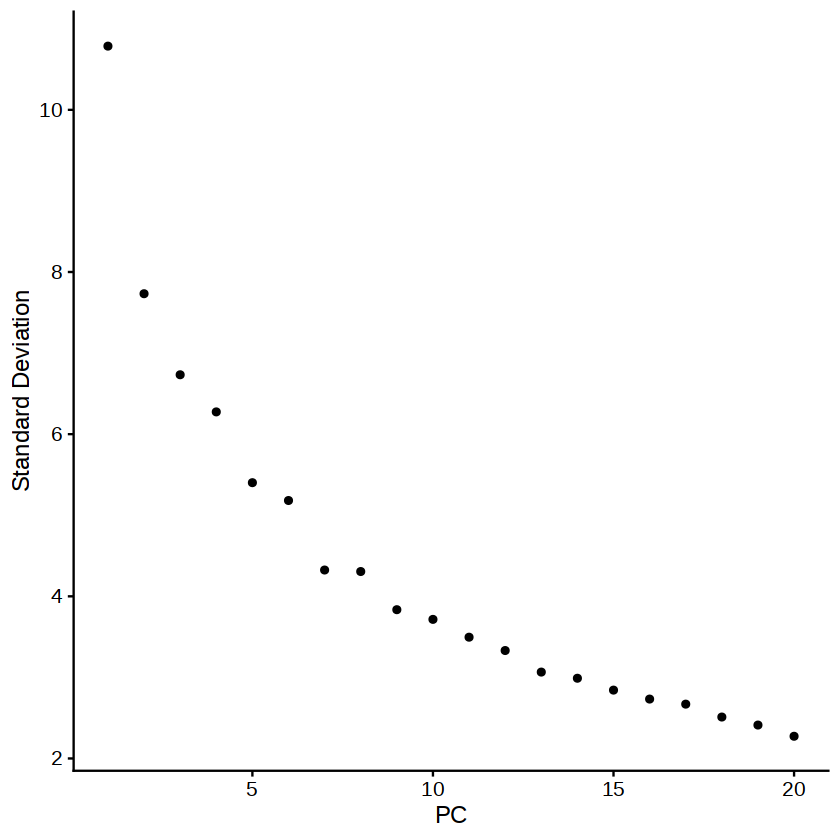

In [25]:
ElbowPlot(object = atlas_seurat)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


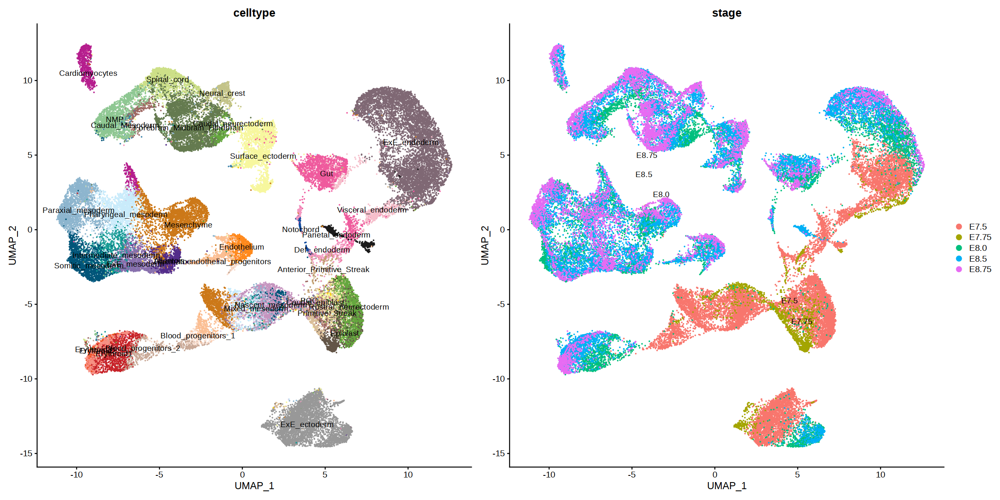

In [26]:
atlas_seurat <- RunUMAP(atlas_seurat, reduction = "pca", dims = 1:20, n.neighbors = 30, verbose = FALSE)

options(repr.plot.width=20, repr.plot.height=10)
# Visualization
p3 <- DimPlot(atlas_seurat, reduction = "umap", group.by = "celltype", label = TRUE) + scale_color_manual(values=celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(atlas_seurat, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE)
p3 + p4

#### Atlas - with regressing variables

In [27]:
# Run the standard workflow for visualization and clustering
atlas_seurat_regress <- ScaleData(atlas_seurat, verbose = FALSE, vars.to.regress = c("nFeature_RNA", "nCount_RNA", "mitochondrial_percent_RNA", "ribosomal_percent_RNA"))
atlas_seurat_regress <- RunPCA(atlas_seurat_regress, npcs = 30, verbose = FALSE)

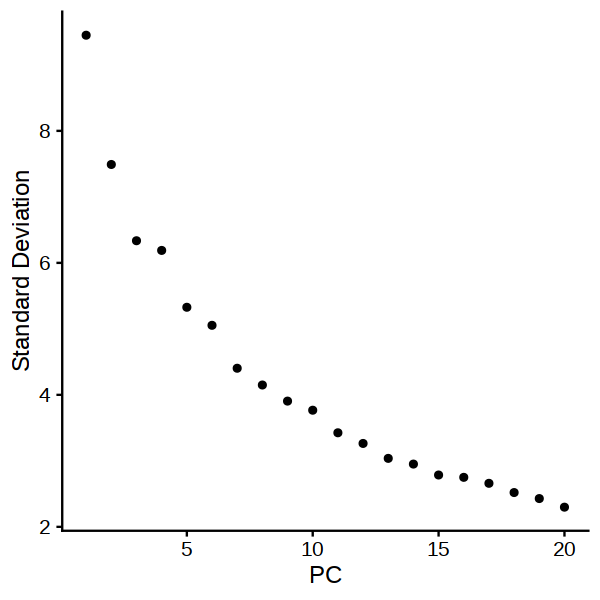

In [28]:
options(repr.plot.width=5, repr.plot.height=5)
ElbowPlot(object = atlas_seurat_regress)

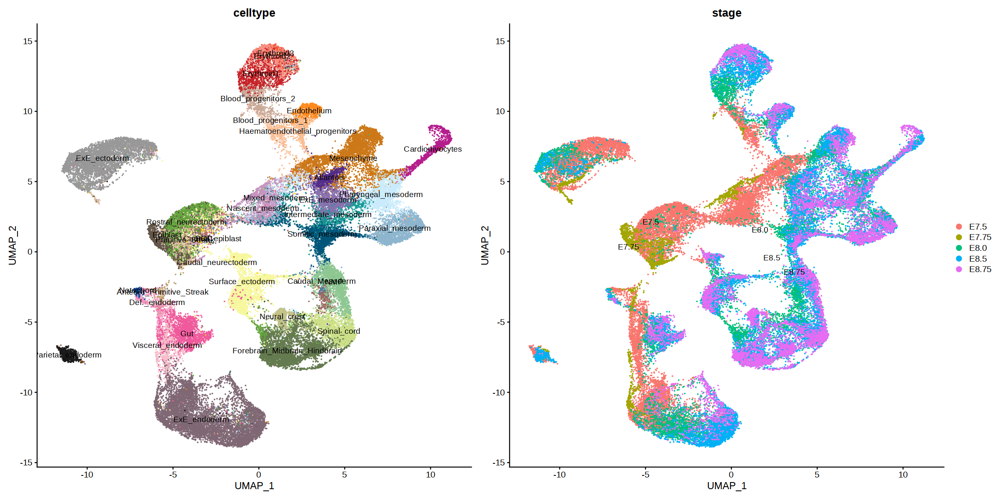

In [29]:
atlas_seurat_regress <- RunUMAP(atlas_seurat_regress, reduction = "pca", dims = 1:20, n.neighbors = 30, verbose = FALSE)

options(repr.plot.width=20, repr.plot.height=10)
# Visualization
p3 <- DimPlot(atlas_seurat_regress, reduction = "umap", group.by = "celltype", label = TRUE) + scale_color_manual(values=celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(atlas_seurat_regress, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE)
p3 + p4

## HE multiome - QC, Normalization, PCA and UMAP 

In [30]:
# normalize and identify variable features for each dataset independently
multiome_seurat <- NormalizeData(multiome_seurat)
multiome_seurat <- FindVariableFeatures(multiome_seurat, selection.method = "vst", nfeatures = 2000)

#### HE multiome - without regressing variables

In [31]:
# Run the standard workflow for visualization and clustering
multiome_seurat <- ScaleData(multiome_seurat, verbose = FALSE)
multiome_seurat <- RunPCA(multiome_seurat, npcs = 30, verbose = FALSE)

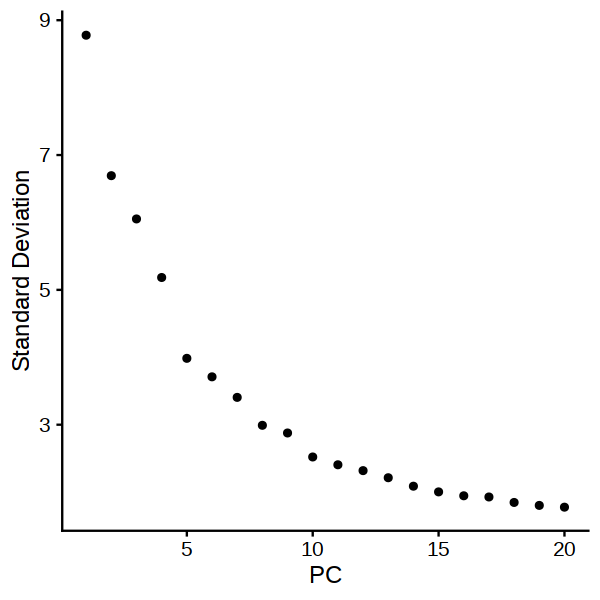

In [32]:
options(repr.plot.width=5, repr.plot.height=5)
ElbowPlot(object = multiome_seurat)

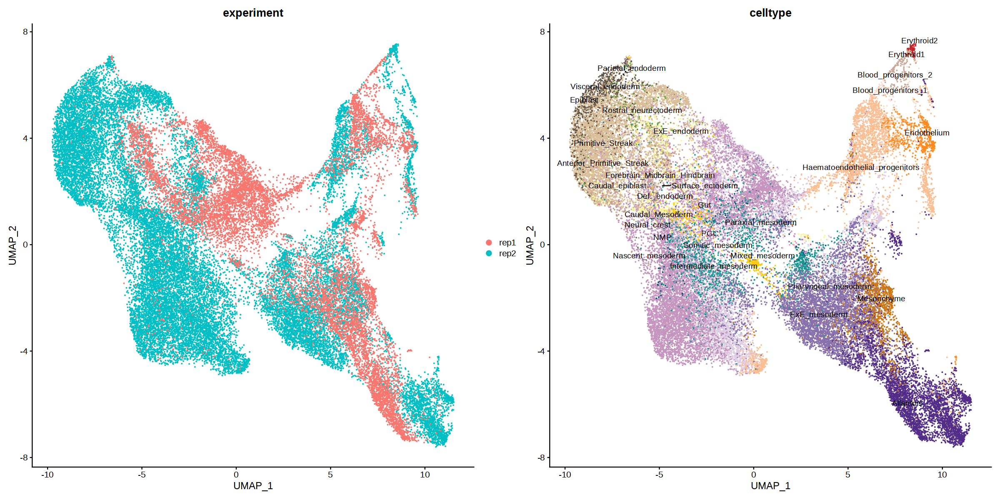

In [33]:
multiome_seurat <- RunUMAP(multiome_seurat, reduction = "pca", dims = 1:20, n.neighbors = 30, verbose=FALSE)
options(repr.plot.width=20, repr.plot.height=10)
# Visualization
p3 <- DimPlot(multiome_seurat, reduction = "umap", group.by = "experiment")
p4 <- DimPlot(multiome_seurat, reduction = "umap", group.by = "celltype", label = TRUE, repel = TRUE) + scale_color_manual(values=celltype.colors) + theme(legend.position='false')
p3 + p4

#### HE multiome - with regressing variables

In [34]:
# Run the standard workflow for visualization and clustering
multiome_seurat_regress <- ScaleData(multiome_seurat, verbose = FALSE, vars.to.regress = c("nFeature_RNA", "nCount_RNA", "mitochondrial_percent_RNA", "ribosomal_percent_RNA"))
multiome_seurat_regress <- RunPCA(multiome_seurat_regress, npcs = 30, verbose = FALSE)

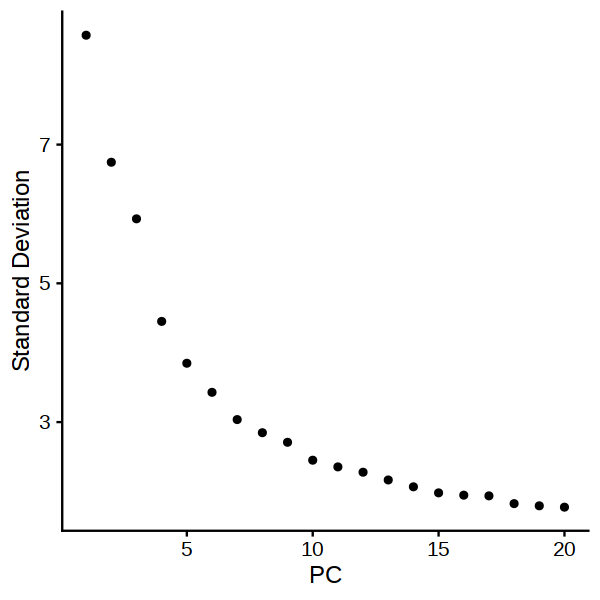

In [35]:
options(repr.plot.width=5, repr.plot.height=5)
ElbowPlot(object = multiome_seurat_regress)

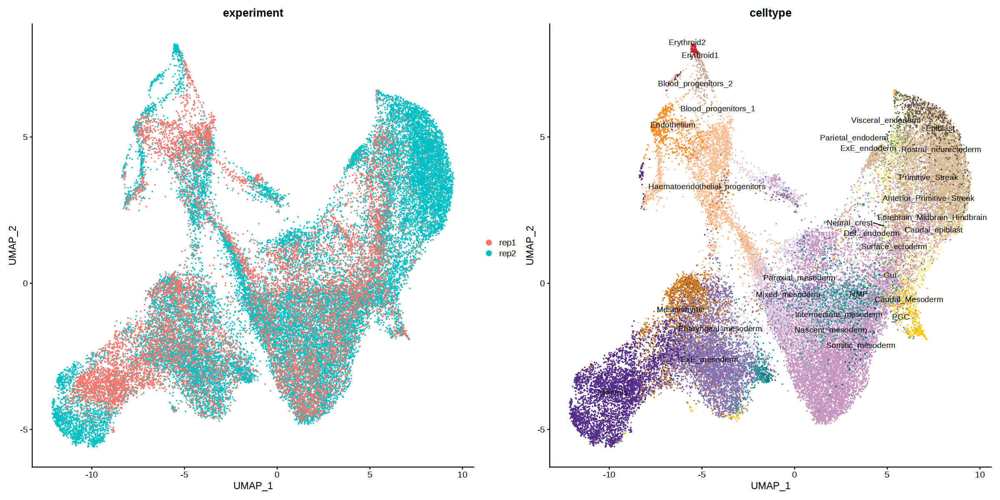

In [36]:
multiome_seurat_regress <- RunUMAP(multiome_seurat_regress, reduction = "pca", dims = 1:20, n.neighbors = 30, verbose=FALSE)
options(repr.plot.width=20, repr.plot.height=10)
# Visualization
p3 <- DimPlot(multiome_seurat_regress, reduction = "umap", group.by = "experiment")
p4 <- DimPlot(multiome_seurat_regress, reduction = "umap", group.by = "celltype", label = TRUE, repel = TRUE) + scale_color_manual(values=celltype.colors) + theme(legend.position='false')
p3 + p4

## Integrating Datasets

In [37]:
# generate an object list of all the seurat objects to integrate
object.list <- list(atlas_seurat, multiome_seurat)
features <- SelectIntegrationFeatures(object.list = object.list)

#### Unregressed data

In [38]:
# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

In [39]:
# Perform integration
anchors <- FindIntegrationAnchors(object.list = object.list, 
                                    reference = 1,  # atlas as reference
                                    scale = TRUE, # scaling again
                                    anchor.features = features, 
                                    reduction = "rpca", 
                                  #  dims = 1:35,
                                    k.anchor = 15)
# this command creates an 'integrated' data assay
integrated <- IntegrateData(anchorset = anchors)

Scaling features for provided objects

Computing within dataset neighborhoods

Finding anchors between all query and reference datasets

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 11007 anchors


Integrating dataset 2 with reference dataset

Finding integration vectors

Finding integration vector weights

Integrating data

Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


In [40]:
integrated

An object of class Seurat 
34285 features across 90397 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 1 other assay present: RNA

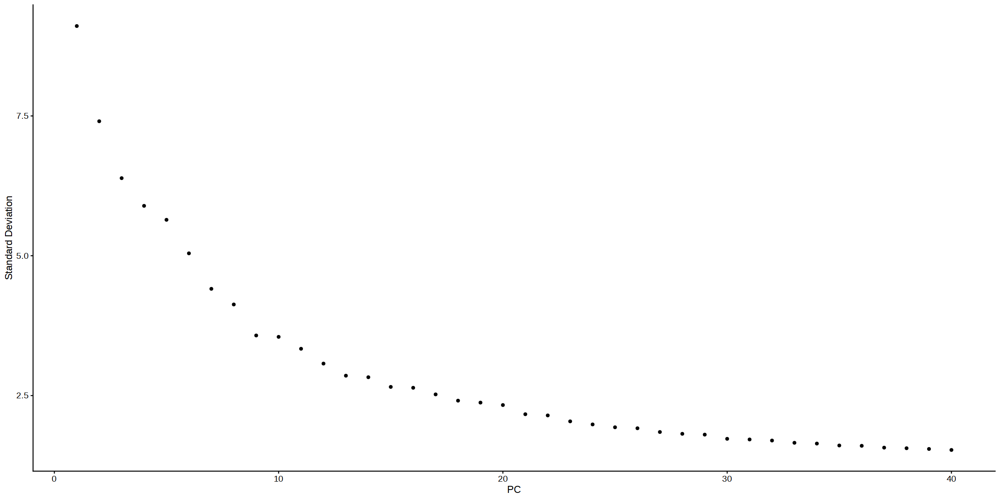

In [41]:
# specify that we will perform downstream analysis on the corrected data note that the
# original unmodified data still resides in the 'RNA' assay
DefaultAssay(integrated) <- "integrated"

# Run the standard workflow for visualization and clustering
integrated <- ScaleData(integrated, verbose = FALSE)
integrated <- RunPCA(integrated, npcs = 40, verbose = FALSE)
ElbowPlot(object = integrated, ndims = 40)

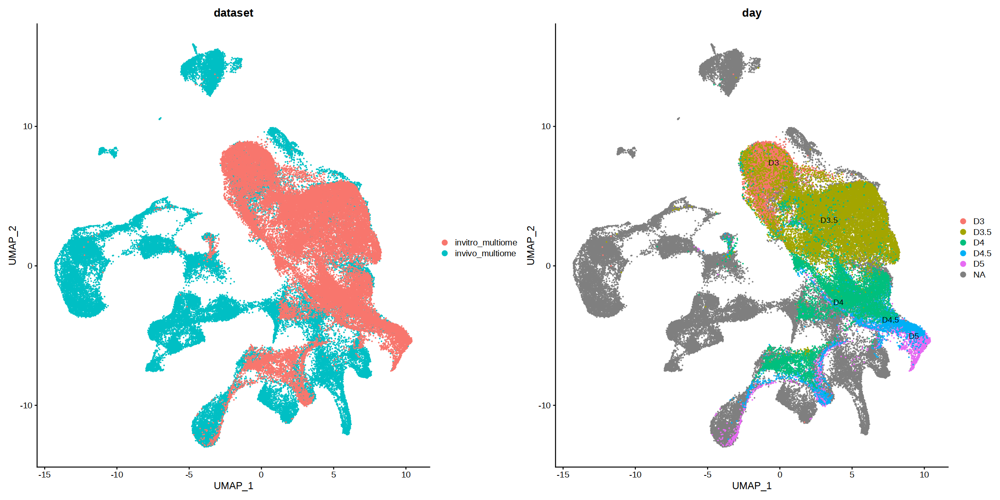

In [42]:
integrated <- RunUMAP(integrated, reduction = "pca", dims = 1:35, n.neighbors = 30, verbose=FALSE)
options(repr.plot.width=20, repr.plot.height=10)
# Visualization
p3 <- DimPlot(integrated, reduction = "umap", group.by = "dataset")
p4 <- DimPlot(integrated, reduction = "umap", group.by = "day", label = TRUE, repel = TRUE)
p3 + p4

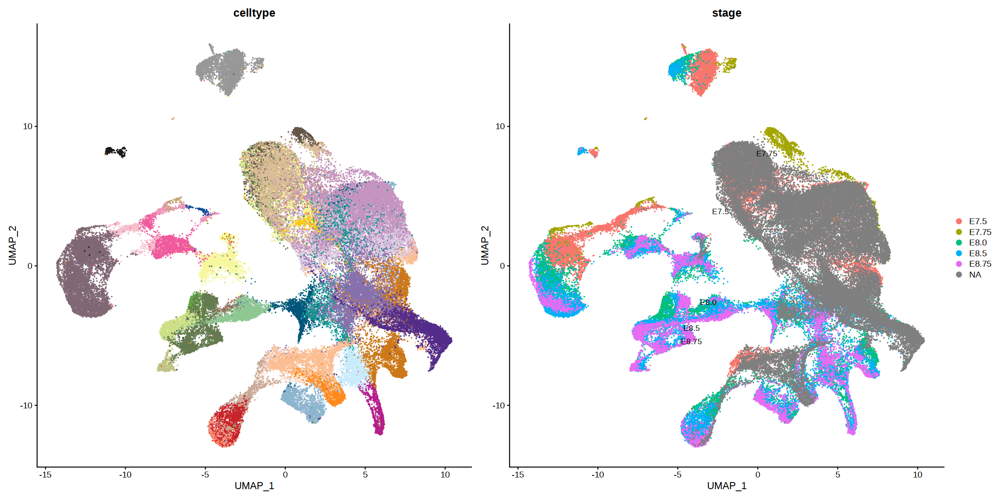

In [43]:
options(repr.plot.width=20, repr.plot.height=10)
p1 = DimPlot(integrated, reduction = "umap", group.by = "celltype") + scale_color_manual(values=celltype.colors) + theme(legend.position='false')
p2 = DimPlot(integrated, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE)
p1 + p2

#### regressed data

In [44]:
# generate an object list of all the seurat objects to integrate
object.list <- list(atlas_seurat_regress, multiome_seurat_regress)
features <- SelectIntegrationFeatures(object.list = object.list)

In [45]:
# Perform integration
anchors <- FindIntegrationAnchors(object.list = object.list, 
                                    reference = 1,  # atlas as reference
                                    scale = FALSE, # SKIP scaling again
                                    anchor.features = features, 
                                    reduction = "rpca", 
                                    #dims = 1:35,
                                    k.anchor = 15)
# this command creates an 'integrated' data assay
integrated_regress <- IntegrateData(anchorset = anchors)

Computing within dataset neighborhoods

Finding anchors between all query and reference datasets

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 10726 anchors


Integrating dataset 2 with reference dataset

Finding integration vectors

Finding integration vector weights

Integrating data

Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


In [46]:
# Did this work or not?

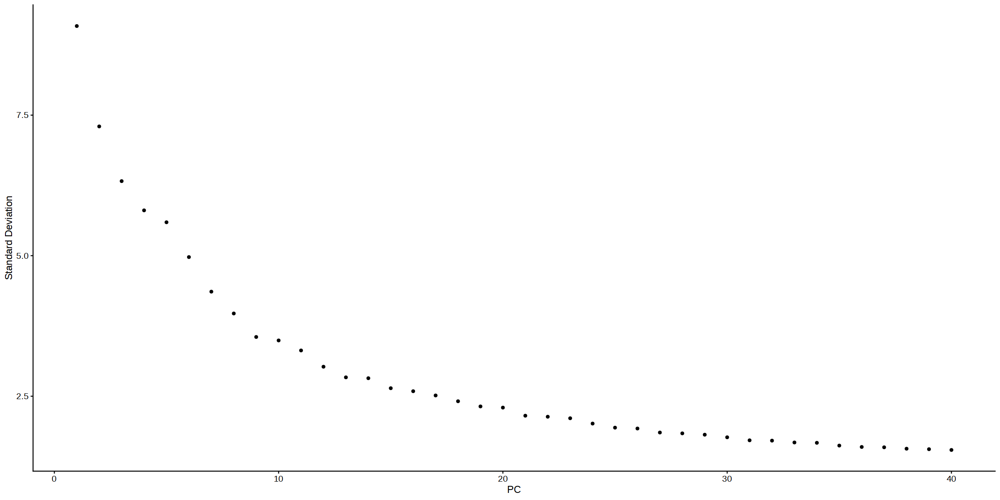

In [47]:
# specify that we will perform downstream analysis on the corrected data note that the
# original unmodified data still resides in the 'RNA' assay
DefaultAssay(integrated_regress) <- "integrated"

# Run the standard workflow for visualization and clustering
integrated_regress <- ScaleData(integrated_regress, verbose = FALSE)
integrated_regress <- RunPCA(integrated_regress, npcs = 40, verbose = FALSE)
ElbowPlot(object = integrated_regress, ndims = 40)

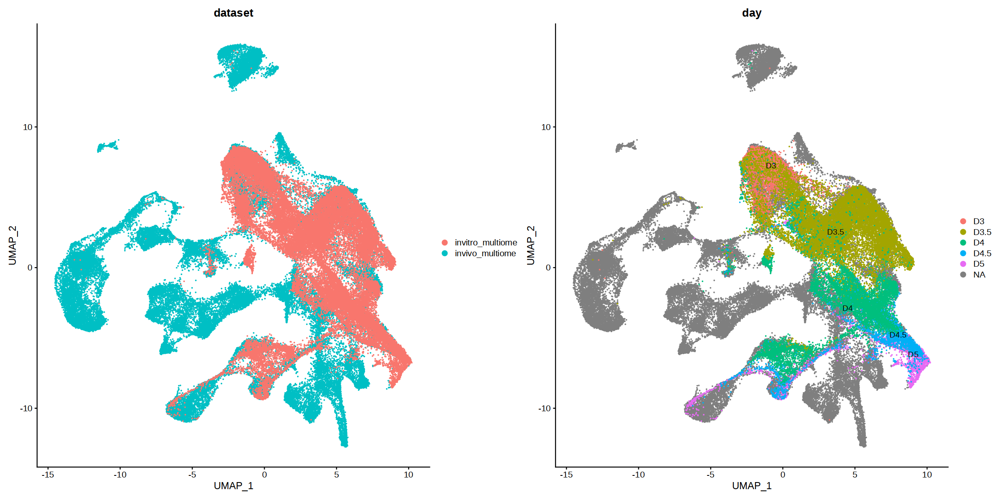

In [48]:
integrated_regress <- RunUMAP(integrated_regress, reduction = "pca", dims = 1:35, n.neighbors = 30, verbose=FALSE)
options(repr.plot.width=20, repr.plot.height=10)
# Visualization
p3 <- DimPlot(integrated_regress, reduction = "umap", group.by = "dataset")
p4 <- DimPlot(integrated_regress, reduction = "umap", group.by = "day", label = TRUE, repel = TRUE)
p3 + p4

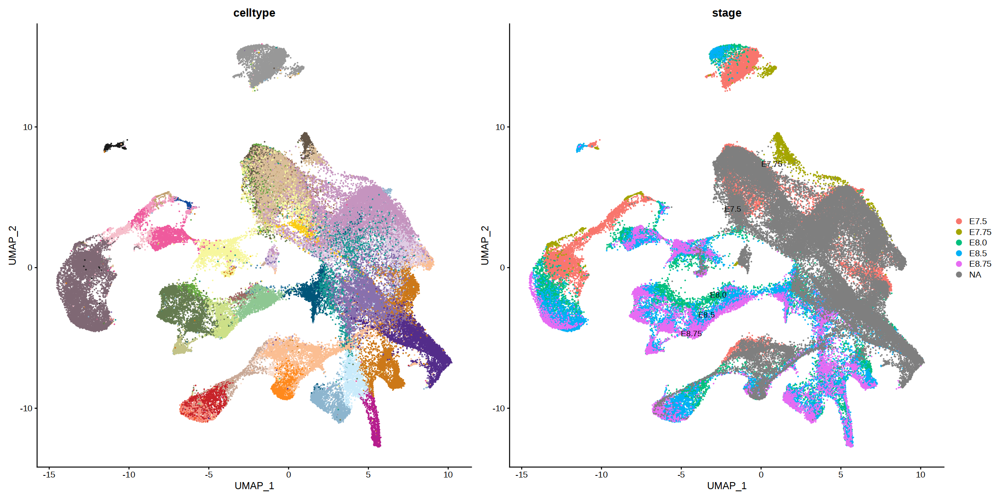

In [49]:
options(repr.plot.width=20, repr.plot.height=10)
p1 = DimPlot(integrated_regress, reduction = "umap", group.by = "celltype") + scale_color_manual(values=celltype.colors) + theme(legend.position='false')
p2 = DimPlot(integrated_regress, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE)
p1 + p2

In [50]:
saveRDS(integrated_regress, sprintf('%s/integrated_regress.rds', io$outdir))

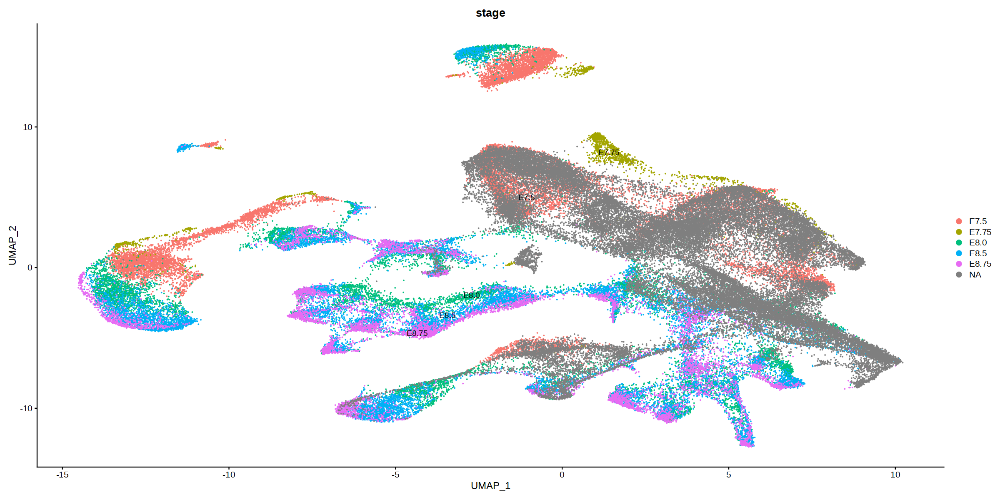

In [51]:
DimPlot(integrated_regress, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE)

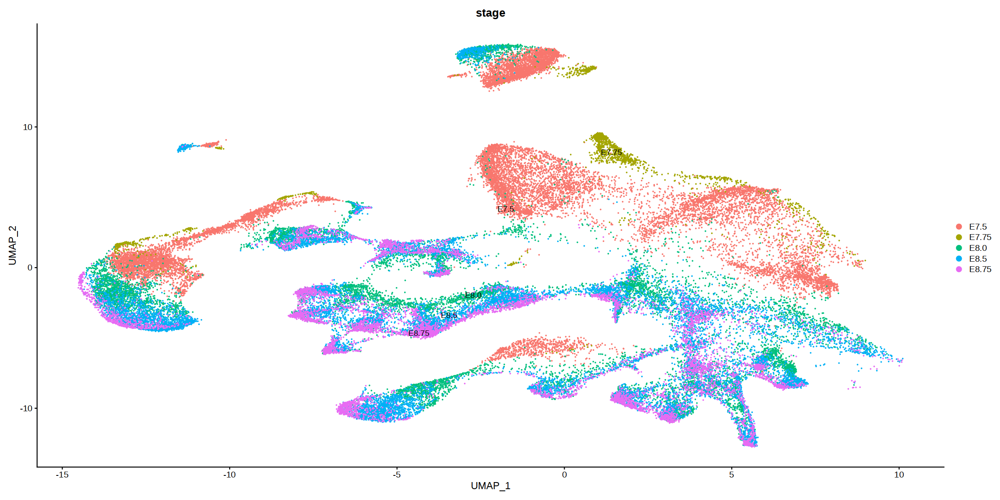

In [52]:
DimPlot(integrated_regress[,integrated_regress@meta.data$dataset=='invivo_multiome'], reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE)

In [53]:
# specify that we will perform downstream analysis on the corrected data note that the
# original unmodified data still resides in the 'RNA' assay
DefaultAssay(integrated_regress) <- "integrated"

# Run the standard workflow for visualization and clustering
integrated_regress <- ScaleData(integrated_regress, verbose = FALSE, vars.to.regress = c("nFeature_RNA", "nCount_RNA", "mitochondrial_percent_RNA", "ribosomal_percent_RNA"))
integrated_regress <- RunPCA(integrated_regress, npcs = 40, verbose = FALSE)

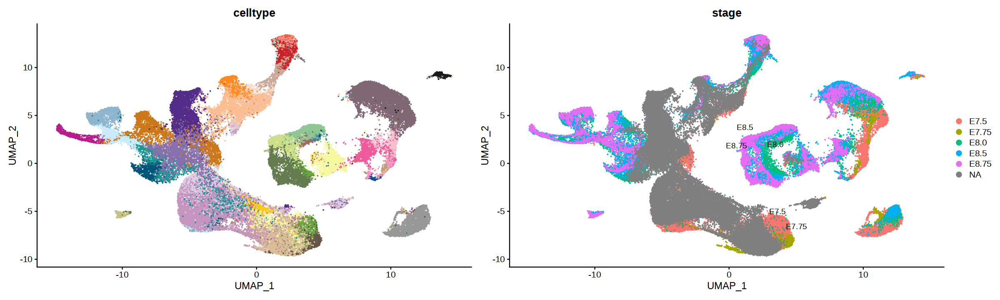

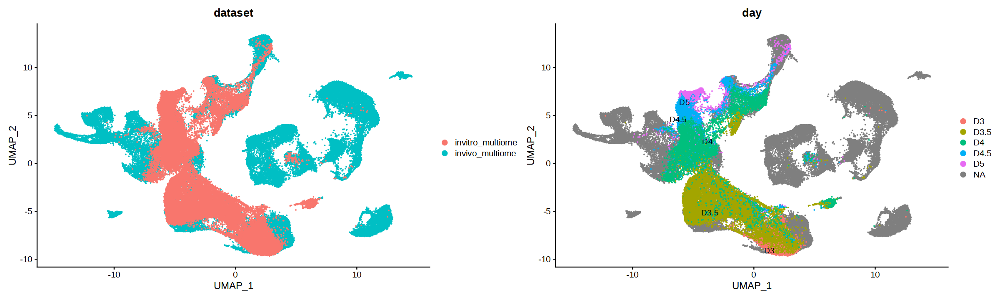

In [54]:
integrated_regress <- RunUMAP(integrated_regress, reduction = "pca", dims = 1:35, n.neighbors = 30, verbose=FALSE)
# Visualization
options(repr.plot.width=20, repr.plot.height=6)
p1 = DimPlot(integrated_regress, reduction = "umap", group.by = "celltype") + scale_color_manual(values=celltype.colors) + theme(legend.position='false')
p2 = DimPlot(integrated_regress, reduction = "umap", group.by = "stage", label = TRUE, repel = TRUE)
p1 + p2
p3 <- DimPlot(integrated_regress, reduction = "umap", group.by = "dataset")
p4 <- DimPlot(integrated_regress, reduction = "umap", group.by = "day", label = TRUE, repel = TRUE)
p3 + p4

# OLD

### Perform Downstream Analyses

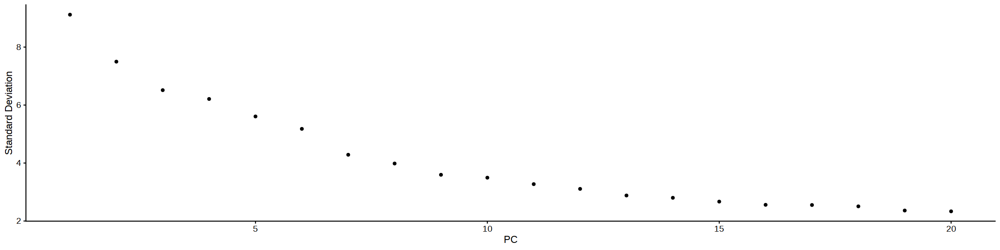

In [139]:
# specify that we will perform downstream analysis on the corrected data note that the
# original unmodified data still resides in the 'RNA' assay
DefaultAssay(integrated.2) <- "integrated"

# Run the standard workflow for visualization and clustering
integrated.2 <- ScaleData(integrated.2, verbose = FALSE)
integrated.2 <- RunPCA(integrated.2, npcs = 30, verbose = FALSE)
ElbowPlot(object = integrated.2)

In [147]:
integrated.2 <- RunUMAP(integrated.2, reduction = "pca", dims = 1:25, n.neighbors = 30)
# integrated.2 <- FindNeighbors(integrated.2, reduction = "pca", dims = 1:15)
# integrated.2 <- FindClusters(integrated.2, resolution = 1)

18:35:28 UMAP embedding parameters a = 0.9922 b = 1.112

18:35:28 Read 103766 rows and found 25 numeric columns

18:35:28 Using Annoy for neighbor search, n_neighbors = 30

18:35:28 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:35:38 Writing NN index file to temp file /tmp/RtmpiutFZ9/file2c880ce66e4

18:35:38 Searching Annoy index using 1 thread, search_k = 3000

18:36:13 Annoy recall = 100%

18:36:14 Commencing smooth kNN distance calibration using 1 thread

18:36:19 Initializing from normalized Laplacian + noise

18:36:32 Commencing optimization for 200 epochs, with 4613872 positive edges

18:38:45 Optimization finished



Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



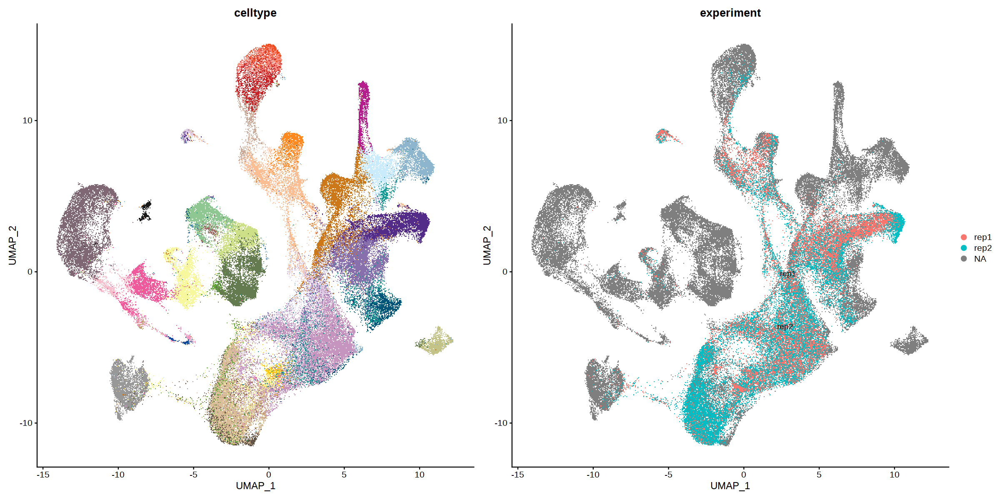

In [149]:
options(repr.plot.width=20, repr.plot.height=10)
# Visualization
p3 <- DimPlot(integrated.2, reduction = "umap", group.by = "celltype") + scale_color_manual(values=celltype.colors) + theme(legend.position='false')
p4 <- DimPlot(integrated.2, reduction = "umap", group.by = "experiment", label = TRUE, repel = TRUE)
p3 + p4

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



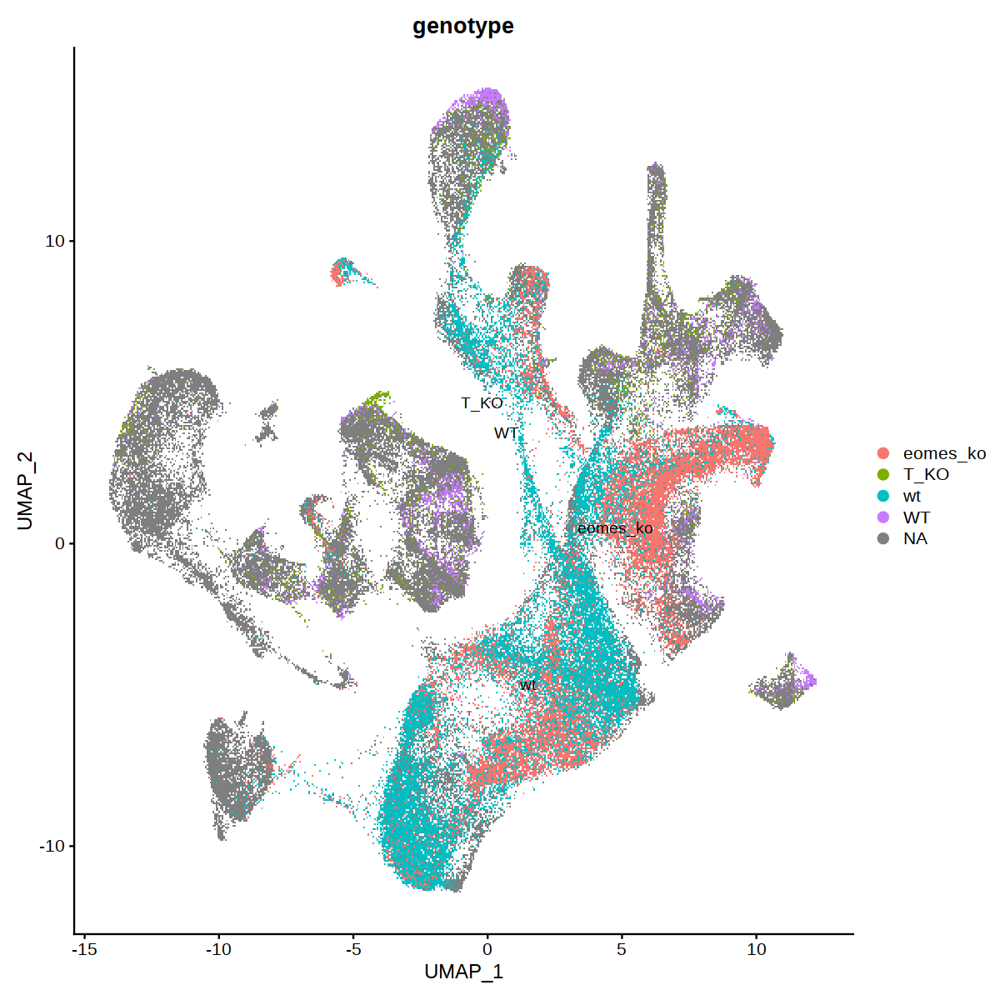

In [150]:
options(repr.plot.width=10, repr.plot.height=10)
# Visualization
DimPlot(integrated.2, reduction = "umap", group.by = "genotype", label = TRUE, repel = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



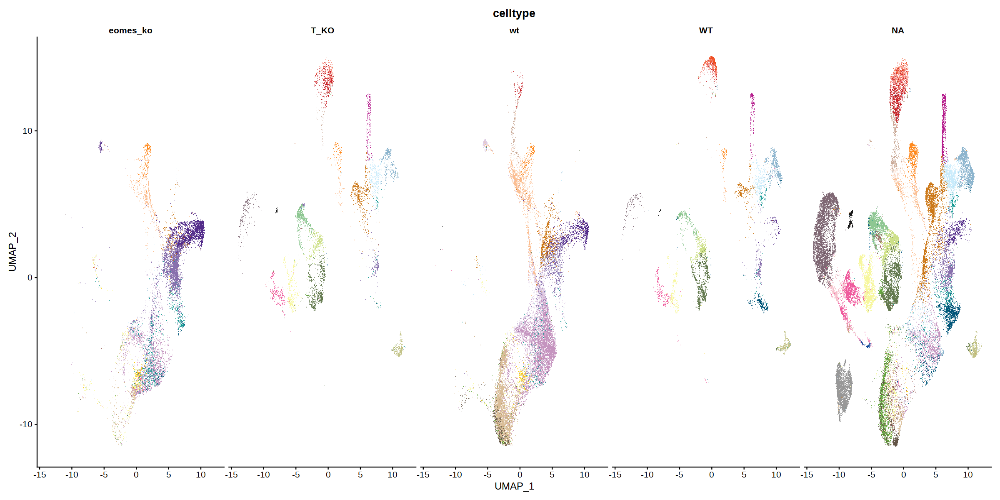

In [152]:
options(repr.plot.width=20, repr.plot.height=10)
# Visualization
p3 <- DimPlot(integrated.2, reduction = "umap", split.by = "genotype", group.by = "celltype") + scale_color_manual(values=celltype.colors) + theme(legend.position='false')
p3

In [157]:
test = integrated.2[,multiome_metadata$cell]

18:49:34 UMAP embedding parameters a = 0.9922 b = 1.112

18:49:34 Read 38346 rows and found 25 numeric columns

18:49:34 Using Annoy for neighbor search, n_neighbors = 30

18:49:34 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:49:38 Writing NN index file to temp file /tmp/RtmpiutFZ9/file2c880406d33b2

18:49:38 Searching Annoy index using 1 thread, search_k = 3000

18:49:49 Annoy recall = 100%

18:49:50 Commencing smooth kNN distance calibration using 1 thread

18:49:53 Initializing from normalized Laplacian + noise

18:49:55 Commencing optimization for 200 epochs, with 1693086 positive edges

18:50:41 Optimization finished



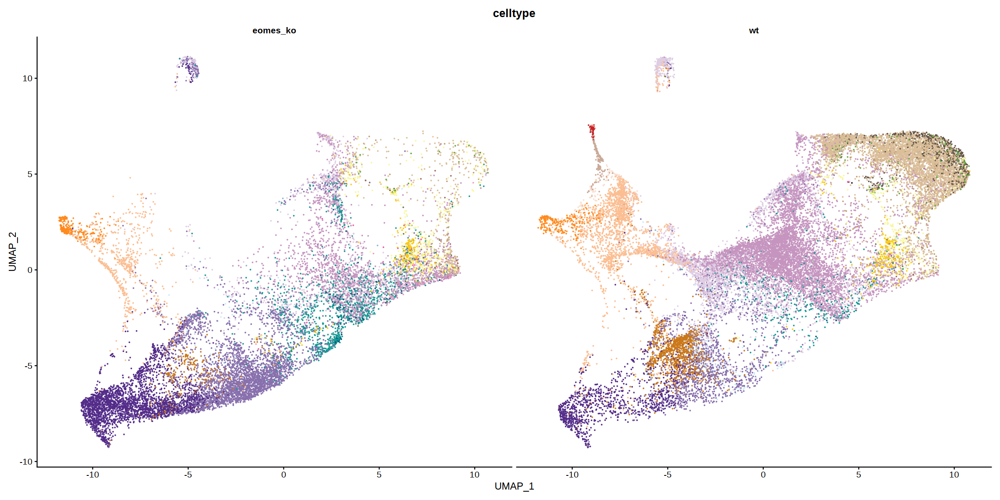

In [158]:
test <- RunUMAP(test, reduction = "pca", dims = 1:25, n.neighbors = 30, verbose=FALSE)
DimPlot(test, reduction = "umap", split.by = "genotype", group.by = "celltype") + scale_color_manual(values=celltype.colors) + theme(legend.position='false')


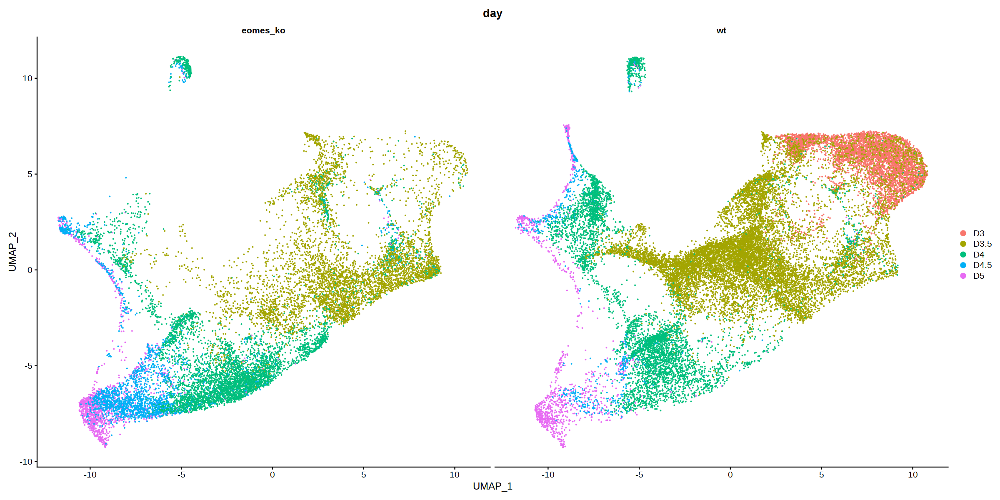

In [159]:
DimPlot(test, reduction = "umap", split.by = "genotype", group.by = "day") 
